In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install torchviz

  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4151 sha256=1e51b0d2388ffb40286d168f65ed8e0b1e9d165a47f008bf8c7b5592d3901d2d
  Stored in directory: /root/.cache/pip/wheels/04/38/f5/dc4f85c3909051823df49901e72015d2d750bd26b086480ec2
Successfully built torchviz


In [ ]:
import torch
import torchvision
import pathlib
import numpy as np
import skimage.io
import matplotlib
import random
import os
import cv2
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.nn.functional as F
from torchvision.datasets import MNIST
from torchvision.transforms import ToTensor
from torchvision.utils import make_grid
from torch.utils.data.dataloader import DataLoader
from torch.utils.data import random_split
from torchvision.datasets import ImageFolder
from sklearn.model_selection import train_test_split
import torchvision.transforms as transforms
from sklearn.model_selection import KFold
from torchsummary import summary
import torch.optim as optim
from PIL import Image
from torchviz import make_dot
import pandas as pd
from scipy import stats
from skimage.util.shape import view_as_windows
import os
%matplotlib inline
import pathlib

In [ ]:
path_tid2013 = '/content/drive/My Drive/image_quality_dataset/TID2013/'
path_live = '/content/drive/My Drive/image_quality_dataset/LIVE/'
path_live_md = '/content/drive/My Drive/image_quality_dataset/LIVE_MD/'
path_live_challenge = '/content/drive/My Drive/image_quality_dataset/LIVE_CHALLENGE/'

meta_tid = pd.read_csv(path_tid2013 + 'meta.csv').rename(columns={'mos_score': 'img_score'})
# meta_tid['img_score'] = (meta_tid['img_score'] / 9)
meta_tid['img_name'] = path_tid2013 + 'Train/' + meta_tid['img_name']
print(meta_tid['img_score'].mean())
meta_tid['source'] = 0
meta_tid = meta_tid.rename(columns={'img_name': 'FilePath'})

meta_live = pd.read_csv(path_live + 'meta.csv')
# meta_live['img_score'] = meta_live['img_score'] / 100
meta_live['img_name'] = path_live + 'Train/' + meta_live['img_name']
print(meta_live['img_score'].mean())
meta_live['source'] = 1
meta_live = meta_live.rename(columns={'img_name': 'FilePath'})

meta_live_md = pd.read_csv(path_live_md + 'meta.csv')
# meta_live_md['img_score'] = meta_live_md['img_score'] / 100
meta_live_md['img_name'] = meta_live_md['img_name'].str.slice(start=1, stop=-1)
meta_live_md['img_name'] = path_live_md + 'Train/' + meta_live_md['img_name']
print(meta_live_md['img_score'].mean())
meta_live_md['source'] = 2
meta_live_md = meta_live_md.rename(columns={'img_name': 'FilePath'})

meta_live_challenge = pd.read_csv(path_live_challenge + 'meta.csv')
# meta_live_challenge['img_score'] = meta_live_challenge['img_score'] / 100
meta_live_challenge['img_name'] = meta_live_challenge['img_name'].str.slice(start=1, stop=-1)
meta_live_challenge['img_name'] = path_live_challenge + 'Train/' + meta_live_challenge['img_name']
print(meta_live_challenge['img_score'].mean())
meta_live_challenge['source'] = 3
meta_live_challenge = meta_live_challenge.rename(columns={'img_name': 'FilePath'})

all_meta = pd.concat([meta_tid, meta_live, meta_live_md, meta_live_challenge, ], ignore_index=True)
all_meta

4.47465680666666
48.7728779402236
47.57974009096818
55.40132498826354


,FilePath,img_score,source
0,/content/drive/My Drive/image_quality_dataset/...,5.514290,0
1,/content/drive/My Drive/image_quality_dataset/...,5.567570,0
2,/content/drive/My Drive/image_quality_dataset/...,4.944440,0
3,/content/drive/My Drive/image_quality_dataset/...,4.378380,0
4,/content/drive/My Drive/image_quality_dataset/...,3.864860,0
...,...,...,...
5383,/content/drive/My Drive/image_quality_dataset/...,21.685859,3
5384,/content/drive/My Drive/image_quality_dataset/...,11.900285,3
5385,/content/drive/My Drive/image_quality_dataset/...,62.661712,3
5386,/content/drive/My Drive/image_quality_dataset/...,87.065592,3


In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""

        return len(self.dl)

In [ ]:
class MyDataset(torch.utils.data.Dataset):
    def __init__(self, dataframe, transform):
        self.dataframe = dataframe
        self.transform = transform
    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, index):
        row = self.dataframe.iloc[index]
        return (
            self.transform(Image.open(row["FilePath"])),
            row["img_score"],
        )

In [ ]:
def get_data_loader(train, test, random_seed, batch_size, transform_train, transform_test):
    
    dataset_train = MyDataset(train, transform = transform_train)
    dataset_test = MyDataset(test, transform = transform_test)
    torch.manual_seed(random_seed)
    val_size = int(len(live_cl_train)*0.2)
    train_size = len(dataset_train) - val_size
    train_ds, val_ds = random_split(dataset_train, [train_size, val_size])
    print('train size:', len(train_ds))
    print('validation size:', len(val_ds))
    batch_size = batch_size
    device = get_default_device()
    print(device)
    train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=4, pin_memory=True)
    val_dl = DataLoader(val_ds, batch_size*2, num_workers=4, pin_memory=True)
    test_dl =  DataLoader(dataset_test, batch_size//2, num_workers=4, pin_memory=True)
    train_dl = DeviceDataLoader(train_dl, device)
    val_dl = DeviceDataLoader(val_dl, device)
    test_dl = DeviceDataLoader(test_dl, device)
    return train_dl, val_dl, test_dl

In [ ]:
def get_data_loader2(train, test, random_seed, batch_size, transform_train, transform_test):
    dataset_train = MyDataset(train, transform = transform_train)
    dataset_test = MyDataset(test, transform = transform_test)
    torch.manual_seed(random_seed)
    batch_size = batch_size
    device = get_default_device()
    print(device)
    train_dl = DataLoader(dataset_train, batch_size, shuffle=True, num_workers=4, pin_memory=True)
    test_dl =  DataLoader(dataset_test, batch_size, num_workers=4, pin_memory=True)
    train_dl = DeviceDataLoader(train_dl, device)
    test_dl = DeviceDataLoader(test_dl, device)
    return train_dl, test_dl

In [ ]:
# functions to show an image
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

In [ ]:
def show_sample_images_in_batch(train_dl):
    # get some random training images
    dataiter = iter(train_dl)
    images, labels = next(dataiter)

    # show images
    imshow(torchvision.utils.make_grid(images))
    # print labels
    print(' '.join('%5s' % labels[j] for j in range(batch_size)))

In [ ]:
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

class ImageClassificationBase(nn.Module):
    def training_step(self, batch):
        images, labels = batch 
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch 
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        # batch_accs = [x['val_acc'] for x in outputs]
        # epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], last_lr: {:.5f}, train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['lrs'][-1], result['train_loss'], result['val_loss'], result['val_acc']))

In [ ]:
class S_CNN(ImageClassificationBase):
    def __init__(self, in_channels, n_classes):
        super().__init__()
        # conv layers: (in_channel size, out_channels size, kernel_size, stride, padding)

        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 48, kernel_size=3, padding=1, stride = 1)
        self.conv1_bn=nn.BatchNorm2d(48)
        self.conv2 = nn.Conv2d(in_channels = 48, out_channels = 48, kernel_size=3, padding=1, stride = 2)
        self.conv2_bn=nn.BatchNorm2d(48)
        self.conv3 = nn.Conv2d(in_channels = 48, out_channels = 64, kernel_size=3, padding=1, stride = 1)
        self.conv3_bn=nn.BatchNorm2d(64)
        self.conv4 = nn.Conv2d(in_channels = 64, out_channels = 64, kernel_size=3, padding=1, stride = 2)
        self.conv4_bn=nn.BatchNorm2d(64)
        self.conv5 = nn.Conv2d(in_channels = 64, out_channels = 64, kernel_size=3, padding=1, stride = 1)
        self.conv5_bn=nn.BatchNorm2d(64)
        self.conv6 = nn.Conv2d(in_channels = 64, out_channels = 64, kernel_size=3, padding=1, stride = 2)
        self.conv6_bn=nn.BatchNorm2d(64)
        self.conv7 = nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size=3, padding=1, stride = 1)
        self.conv7_bn=nn.BatchNorm2d(128)
        self.conv8 = nn.Conv2d(in_channels = 128, out_channels = 128, kernel_size=3, padding=1, stride = 1)
        self.conv8_bn=nn.BatchNorm2d(128)
        self.conv9 = nn.Conv2d(in_channels = 128, out_channels = 128, kernel_size=3, padding=1, stride = 2)
        self.conv9_bn=nn.BatchNorm2d(128)
        

        # average pooling (kernel_size, stride)
        self.pool = nn.AdaptiveAvgPool2d((14, 14))

        # fully conected layers:
        self.fc1 = nn.Linear(14*14*128, 128)
        self.fc1_bn=nn.BatchNorm1d(128)
        self.fc2 = nn.Linear(128, 256)
        self.fc2_bn=nn.BatchNorm1d(256)
        self.fc3 = nn.Linear(256, n_classes)
        self.fc3_bn=nn.BatchNorm1d(n_classes)

    def forward(self, x, training=True):
        x = self.conv1(x)
        x = F.relu(self.conv1_bn(x))
        x = self.conv2(x)
        x = F.relu(self.conv2_bn(x))
        x = self.conv3(x)
        x = F.relu(self.conv3_bn(x))
        x = self.conv4(x)
        x = F.relu(self.conv4_bn(x))
        x = self.conv5(x)
        x = F.relu(self.conv5_bn(x))
        x = self.conv6(x)
        x = F.relu(self.conv6_bn(x))
        x = self.conv7(x)
        x = F.relu(self.conv7_bn(x))
        x = self.conv8(x)
        x = F.relu(self.conv8_bn(x))
        x = self.conv9(x)
        x = F.relu(self.conv9_bn(x))
        x = self.pool(x)
        x = x.view(-1, 14 * 14 * 128)
        x = self.fc1(x)
        x = F.relu(self.fc1_bn(x))
        x = F.dropout(x, 0.2)

        x = self.fc2(x)
        x = F.relu(self.fc2_bn(x))
        x = F.dropout(x, 0.2)

        x = self.fc3(x)
        x = F.relu(self.fc3_bn(x))
        x = F.dropout(x, 0.2)

        return x

In [ ]:
import types
import torch
import torch.nn as nn
from torch.autograd import Function

def CountSketchFn_forward(h, s, output_size, x, force_cpu_scatter_add=False):
    x_size = tuple(x.size())

    s_view = (1,) * (len(x_size)-1) + (x_size[-1],)

    out_size = x_size[:-1] + (output_size,)
    # print(s_view, s, x_size, out_size)
    # Broadcast s and compute x * s
    s = s.view(s_view)
    xs = x * s

    # Broadcast h then compute h:
    # out[h_i] += x_i * s_i
    h = h.view(s_view).expand(x_size)

    if force_cpu_scatter_add:
        out = x.new(*out_size).zero_().cpu()
        return out.scatter_add_(-1, h.cpu(), xs.cpu()).cuda()
    else:
        out = x.new(*out_size).zero_()
        return out.scatter_add_(-1, h, xs)


def CountSketchFn_backward(h, s, x_size, grad_output):
    s_view = (1,) * (len(x_size)-1) + (x_size[-1],)

    s = s.view(s_view)
    h = h.view(s_view).expand(x_size)

    grad_x = grad_output.gather(-1, h)
    grad_x = grad_x * s
    return grad_x

class CountSketchFn(Function):

    @staticmethod
    def forward(ctx, h, s, output_size, x, force_cpu_scatter_add=False):
        x_size = tuple(x.size())

        ctx.save_for_backward(h,s)
        ctx.x_size = tuple(x.size())

        return CountSketchFn_forward(h, s, output_size, x, force_cpu_scatter_add)


    @staticmethod
    def backward(ctx, grad_output):
        h,s = ctx.saved_variables

        grad_x = CountSketchFn_backward(h,s,ctx.x_size,grad_output)
        return None, None, None, grad_x

class CountSketch(nn.Module):
    r"""Compute the count sketch over an input signal.

    .. math::

        out_j = \sum_{i : j = h_i} s_i x_i

    Args:
        input_size (int): Number of channels in the input array
        output_size (int): Number of channels in the output sketch
        h (array, optional): Optional array of size input_size of indices in the range [0,output_size]
        s (array, optional): Optional array of size input_size of -1 and 1.

    .. note::

        If h and s are None, they will be automatically be generated using LongTensor.random_.

    Shape:
        - Input: (...,input_size)
        - Output: (...,output_size)

    References:
        Yang Gao et al. "Compact Bilinear Pooling" in Proceedings of IEEE Conference on Computer Vision and Pattern Recognition (2016).
        Akira Fukui et al. "Multimodal Compact Bilinear Pooling for Visual Question Answering and Visual Grounding", arXiv:1606.01847 (2016).
    """

    def __init__(self, input_size, output_size, h = None, s = None):
        super(CountSketch, self).__init__()

        self.input_size = input_size
        self.output_size = output_size

        if h is None:
            h = torch.LongTensor(input_size).random_(0, output_size)
        if s is None:
            s = 2 * torch.Tensor(input_size).random_(0,2) - 1

        # The Variable h being a list of indices,
        # If the type of this module is changed (e.g. float to double),
        # the variable h should remain a LongTensor
        # therefore we force float() and double() to be no-ops on the variable h.
        def identity(self):
            return self

        h.float = types.MethodType(identity,h)
        h.double = types.MethodType(identity,h)

        self.register_buffer('h',h)
        self.register_buffer('s',s)

    def forward(self, x):
        x_size = list(x.size())

        assert(x_size[-1] == self.input_size)

        return CountSketchFn.apply(self.h, self.s, self.output_size, x)

def ComplexMultiply_forward(X_re, X_im, Y_re, Y_im):
    Z_re = torch.addcmul(X_re*Y_re, -1, X_im, Y_im)
    Z_im = torch.addcmul(X_re*Y_im,  1, X_im, Y_re)
    return Z_re,Z_im

def ComplexMultiply_backward(X_re, X_im, Y_re, Y_im, grad_Z_re, grad_Z_im):
    grad_X_re = torch.addcmul(grad_Z_re * Y_re,  1, grad_Z_im, Y_im)
    grad_X_im = torch.addcmul(grad_Z_im * Y_re, -1, grad_Z_re, Y_im)
    grad_Y_re = torch.addcmul(grad_Z_re * X_re,  1, grad_Z_im, X_im)
    grad_Y_im = torch.addcmul(grad_Z_im * X_re, -1, grad_Z_re, X_im)
    return grad_X_re,grad_X_im,grad_Y_re,grad_Y_im

class ComplexMultiply(torch.autograd.Function):

    @staticmethod
    def forward(ctx, X_re, X_im, Y_re, Y_im):
        ctx.save_for_backward(X_re,X_im,Y_re,Y_im)
        return ComplexMultiply_forward(X_re, X_im, Y_re, Y_im)

    @staticmethod
    def backward(ctx,grad_Z_re, grad_Z_im):
        X_re,X_im,Y_re,Y_im = ctx.saved_tensors
        return ComplexMultiply_backward(X_re,X_im,Y_re,Y_im, grad_Z_re, grad_Z_im)

class CompactBilinearPoolingFn(Function):

    @staticmethod
    def forward(ctx, h1, s1, h2, s2, output_size, x, y, force_cpu_scatter_add=False):
        ctx.save_for_backward(h1,s1,h2,s2,x,y)
        ctx.x_size = tuple(x.size())
        ctx.y_size = tuple(y.size())
        ctx.force_cpu_scatter_add = force_cpu_scatter_add
        ctx.output_size = output_size

        # Compute the count sketch of each input
        px = CountSketchFn_forward(h1, s1, output_size, x, force_cpu_scatter_add)
        # print('px', px)
        # fx = torch.rfft(px,1)
        # fx = torch.fft.rfft(px)
        fx = torch.view_as_real(torch.fft.rfft(px))
        # print('fx', fx)
        re_fx = fx.select(-1, 0)
        im_fx = fx.select(-1, 1)
        
        del px
        py = CountSketchFn_forward(h2, s2, output_size, y, force_cpu_scatter_add)
        fy = torch.view_as_real(torch.fft.rfft(py))
        # fy = torch.rfft(py,1)
   
        re_fy = fy.select(-1,0)
        im_fy = fy.select(-1,1)
        del py

        # Convolution of the two sketch using an FFT.
        # Compute the FFT of each sketch


        # Complex multiplication
        re_prod, im_prod = ComplexMultiply_forward(re_fx,im_fx,re_fy,im_fy)

        # Back to real domain
        # The imaginary part should be zero's
        re = torch.fft.irfft(torch.view_as_complex(torch.stack((re_prod, im_prod), re_prod.dim())))
        # print(torch.view_as_complex(torch.stack((re_prod, im_prod), re_prod.dim())))
        # print(re)
        # print(re.shape)
        return re

    @staticmethod
    def backward(ctx,grad_output):
        h1,s1,h2,s2,x,y = ctx.saved_tensors

        # Recompute part of the forward pass to get the input to the complex product
        # Compute the count sketch of each input
        px = CountSketchFn_forward(h1, s1, ctx.output_size, x, ctx.force_cpu_scatter_add)
        py = CountSketchFn_forward(h2, s2, ctx.output_size, y, ctx.force_cpu_scatter_add)

        # Then convert the output to Fourier domain
        grad_output = grad_output.contiguous()
        grad_prod = torch.view_as_real(torch.fft.rfft(grad_output))
        grad_re_prod = grad_prod.select(-1, 0)
        grad_im_prod = grad_prod.select(-1, 1)

        # Compute the gradient of x first then y
        
        # Gradient of x
        # Recompute fy
        # fy = torch.rfft(py,1)
        fy = torch.view_as_real(torch.fft.rfft(py))
  
        re_fy = fy.select(-1,0)
        im_fy = fy.select(-1,1)
        del py
        # Compute the gradient of fx, then back to temporal space
        grad_re_fx = torch.addcmul(grad_re_prod * re_fy,  1, grad_im_prod, im_fy)
        grad_im_fx = torch.addcmul(grad_im_prod * re_fy, -1, grad_re_prod, im_fy)
        grad_fx = torch.fft.irfft(torch.view_as_complex(torch.stack((grad_re_fx,grad_im_fx), grad_re_fx.dim())))
        # Finally compute the gradient of x
        grad_x = CountSketchFn_backward(h1, s1, ctx.x_size, grad_fx)
        del re_fy,im_fy,grad_re_fx,grad_im_fx,grad_fx

        # Gradient of y
        # Recompute fx
        # fx = torch.rfft(px,1)
        fx = torch.view_as_real(torch.fft.rfft(px))

        re_fx = fx.select(-1, 0)
        im_fx = fx.select(-1, 1)

        del px
        # Compute the gradient of fy, then back to temporal space
        grad_re_fy = torch.addcmul(grad_re_prod * re_fx,  1, grad_im_prod, im_fx)
        grad_im_fy = torch.addcmul(grad_im_prod * re_fx, -1, grad_re_prod, im_fx)
        grad_fy = torch.fft.irfft(torch.view_as_complex(torch.stack((grad_re_fy,grad_im_fy), grad_re_fy.dim())))
        # Finally compute the gradient of y
        grad_y = CountSketchFn_backward(h2, s2, ctx.y_size, grad_fy)
        del re_fx,im_fx,grad_re_fy,grad_im_fy,grad_fy

        return None, None, None, None, None, grad_x, grad_y, None

class CompactBilinearPooling(nn.Module):
    r"""Compute the compact bilinear pooling between two input array x and y

    .. math::

        out = \Psi (x,h_1,s_1) \ast \Psi (y,h_2,s_2)

    Args:
        input_size1 (int): Number of channels in the first input array
        input_size2 (int): Number of channels in the second input array
        output_size (int): Number of channels in the output array
        h1 (array, optional): Optional array of size input_size of indices in the range [0,output_size]
        s1 (array, optional): Optional array of size input_size of -1 and 1.
        h2 (array, optional): Optional array of size input_size of indices in the range [0,output_size]
        s2 (array, optional): Optional array of size input_size of -1 and 1.
        force_cpu_scatter_add (boolean, optional): Force the scatter_add operation to run on CPU for testing purposes

    .. note::

        If h1, s1, s2, h2 are None, they will be automatically be generated using LongTensor.random_.

    Shape:
        - Input 1: (...,input_size1)
        - Input 2: (...,input_size2)
        - Output: (...,output_size)

    References:
        Yang Gao et al. "Compact Bilinear Pooling" in Proceedings of IEEE Conference on Computer Vision and Pattern Recognition (2016).
        Akira Fukui et al. "Multimodal Compact Bilinear Pooling for Visual Question Answering and Visual Grounding", arXiv:1606.01847 (2016).
    """
    def __init__(self, input1_size, input2_size, output_size, h1 = None, s1 = None, h2 = None, s2 = None, force_cpu_scatter_add=False):
        super(CompactBilinearPooling, self).__init__()
        self.add_module('sketch1', CountSketch(input1_size, output_size, h1, s1))
        self.add_module('sketch2', CountSketch(input2_size, output_size, h2, s2))
        self.output_size = output_size
        self.force_cpu_scatter_add = force_cpu_scatter_add

    def forward(self, x, y = None):
        if y is None:
            y = x

        return CompactBilinearPoolingFn.apply(self.sketch1.h, self.sketch1.s, self.sketch2.h, self.sketch2.s, self.output_size, x, y, self.force_cpu_scatter_add)

In [ ]:
class ImageRegression(nn.Module):
    def training_step(self, batch):
        images, mos_scores = batch 
        out = self(images)                  # Generate predictions
        mse_loss = nn.MSELoss()
        loss = mse_loss(out[:, 0].float(), mos_scores.float())  # Calculate loss
        
        # print('loss:',loss)
        return loss
    
    def validation_step(self, batch):
        images, mos_scores = batch
        out = self(images)                    # Generate predictions
        mse_loss = nn.MSELoss()
        loss = mse_loss(out[:, 0].float(), mos_scores.float())   # Calculate loss
        # print(out[:, 0].float(), mos_scores.float())
        
        return {'val_loss': loss.detach()}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        # batch_srccs = [x['val_srcc'] for x in outputs]
        # epoch_acc = torch.stack(batch_srccs).mean()
        return {'val_loss': epoch_loss.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], srcc_train: {:.5f}, plcc_train: {:.5f}, srcc_val: {:.5f}, plcc_val: {:.5f}, loss_train: {:.4f}, loss_test: {:.4f}".format(
            epoch, result['srcc_train'], result['plcc_train'], result['srcc_val'], result['plcc_val'], result['train_loss'], result['val_loss']))

In [ ]:
class DB_CNN(ImageRegression):
    def __init__(self, options=True, dropout_ratio=0.2):
        super().__init__()
        s_cnn = S_CNN(3, 27).to(device)
        s_cnn.load_state_dict(torch.load('/content/drive/My Drive/Image_data/revised_model_13_10_2021_0.pth'))
        vgg16 = torchvision.models.vgg16_bn(pretrained=True)
        self.synth_extractor = torch.nn.Sequential(*(list(s_cnn.children())[:-7]))
        self.auth_extractor = torch.nn.Sequential(*(list(vgg16.children())[0][:-1]))
        
        self.compact_bilinear_pooling = CompactBilinearPooling(128*28*28, 512*28*28, 128*512).cuda()
        self.flatten = torch.nn.Flatten()
        self.activation = torch.nn.Sigmoid()
        self.dropout = nn.Dropout(dropout_ratio)
        self.fc = torch.nn.Linear(512*128, 1)
        self.bn = nn.BatchNorm1d(512*128)
        if options == True:
            # Freeze all previous layers.
            for param in self.synth_extractor.parameters():
                param.requires_grad = False
            for param in self.auth_extractor.parameters():
                param.requires_grad = False
            # Initialize the fc layers.
            nn.init.kaiming_normal_(self.fc.weight.data)
            if self.fc.bias is not None:
                nn.init.constant_(self.fc.bias.data, val=0)

    def forward(self, x, training=True):
        synth_result = self.synth_extractor(x)
        auth_result = self.auth_extractor(x)
        synth_result = self.flatten(synth_result)
        auth_result = self.flatten(auth_result)
        bi_result = self.compact_bilinear_pooling(synth_result, auth_result)
        # x = torch.sqrt(bi_result + 1e-8)
        x = torch.nn.functional.normalize(bi_result)
        # print(x.shape)
        x = self.bn(x)
        x = self.dropout(x)
        x = self.fc(x)
        return x

In [ ]:
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

def get_correlation(model, data_loader):
    model.eval()
    mos_score_list = []
    model_score_list = []
    with torch.no_grad():
        for batch in data_loader:
            images, mos_scores = batch
            images = torch.tensor(images.cuda())

            model_score = model(images)[:, 0]
            mos_scores = torch.tensor(mos_scores.cuda())
            
            model_score_list = model_score_list +  model_score.cpu().tolist()
            mos_score_list = mos_score_list + mos_scores.cpu().tolist()
    srcc, _ = stats.spearmanr(mos_score_list,model_score_list)
    plcc, _ = stats.pearsonr(mos_score_list,model_score_list)
    return srcc, plcc
      

def fit_one_cycle(epochs, max_lr, model, train_loader, val_loader, 
                  weight_decay=0, grad_clip=None, opt_func=torch.optim.SGD):
    best_plcc = 0.7
    torch.cuda.empty_cache()
    history = []
    rand_path_num = random.randint(100000, 999999)
    save_name = 'db_cnn_v2_challenge'+'.pth'
    path = '/content/drive/My Drive/Image_data/'
    save_path = os.path.join(path, save_name)
    print("model will be saved to: {}".format(save_path))
    # Set up cutom optimizer with weight decay
    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # Set up one-cycle learning rate scheduler
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epochs, steps_per_epoch=len(train_loader))
    
    for epoch in range(epochs):
        # Training Phase 
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            
            # Gradient clipping
            if grad_clip: 
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)
            
            optimizer.step()
            optimizer.zero_grad()
            
            # Record & update learning rate
            lrs.append(get_lr(optimizer))
            sched.step()
        
        # Validation phase
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        srcc_train, plcc_train = get_correlation(model, train_loader)
        srcc_val, plcc_val = get_correlation(model, val_loader)
        if plcc_val > best_plcc:
            torch.save(model.state_dict(), save_path)
            best_plcc = plcc_val
        result['srcc_train'] = srcc_train
        result['plcc_train'] = plcc_train
        result['srcc_val'] = srcc_val
        result['plcc_val'] = plcc_val
        model.epoch_end(epoch, result)
        history.append(result)
        # print("srcc_train: {:.5f}, plcc_train: {:.5f}, srcc_val: {:.5f}, plcc_val: {:.5f}".format(srcc_train, plcc_train, srcc_val, plcc_val))
    return history, save_path

In [ ]:
def get_model_graph(model, train_loader, image_name='DB_CNN'):
    dataiter = iter(train_loader)
    images, labels = next(dataiter)
    yhat = model(images)
    make_dot(yhat, params=dict(list(db_cnn.named_parameters()))).render(image_name, format="png")

In [ ]:
def train_process(freeze, epochs, max_lr, grad_clip, weight_decay, opt_func, train_dl, val_dl):
    model = DB_CNN(options=freeze).to(device)
    history = [evaluate(model, val_dl)]
    print(history)
    histoty_tmp, save_path = fit_one_cycle(epochs, max_lr, model, train_dl, val_dl, 
                                           grad_clip=grad_clip, 
                                           weight_decay=weight_decay, 
                                           opt_func=opt_func)
    history += histoty_tmp
    model2 = DB_CNN(options=freeze).to(device)
    model2.load_state_dict(torch.load(save_path))
    return history, model, model2

In [ ]:
def plot_losses(history):
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['val_loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs')
    plt.show()

In [ ]:
def plot_srcc(history):
    train_srcc = [x.get('srcc_train') for x in history]
    val_srcc = [x.get('srcc_val') for x in history]
    plt.plot(train_srcc, '-bx')
    plt.plot(val_srcc, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('srcc')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs')
    plt.show()

In [ ]:
def plot_plcc(history):
    train_plcc = [x.get('plcc_train') for x in history]
    val_plcc = [x.get('plcc_val') for x in history]
    plt.plot(train_plcc, '-bx')
    plt.plot(val_plcc, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('plcc')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs')
    plt.show()

In [ ]:
def get_result(model, test, transform):
    model.eval()
    real = []
    predict = []
    dataset_test = MyDataset(test, transform)
    for img, score in dataset_test:
        torch.cuda.empty_cache()
        xb = to_device(img.unsqueeze(0), device)
        yb = model(xb)
        real.append(score)
        predict.append(yb.item())
    plt.scatter(real, predict)
    plt.xlabel("real_MOS_score")
    plt.ylabel("model_MOS_score")
    test_srcc, _ = stats.spearmanr(real,predict)
    test_plcc, _ = stats.pearsonr(real,predict)
    print('srcc:', test_srcc, 'plcc:', test_plcc)
    plt.show()
    return test_srcc, test_plcc

###Process database

In [ ]:
def get_train_test_meta(meta, train_size=0.80, random_state=2021):
  return train_test_split(meta, train_size=train_size, shuffle=True, random_state=random_state)
# tid_train, tid_test = get_train_test_meta(meta_tid.drop('source', 1))
# live_train, live_test = get_train_test_meta(meta_live.drop('source', 1))
# live_md_train, live_md_test = get_train_test_meta(meta_live_md.drop('source', 1))
live_cl_train, live_cl_test = get_train_test_meta(meta_live_challenge.drop('source', 1))

###LIVE Challenge database

In [ ]:
sample_live_cl_test = live_cl_test
sample_live_cl_test['bin'] = live_cl_test['img_score']//10
sample_live_cl_test['bin'].value_counts()
# ax = sample_live_cl_test['bin'].plot.hist(bins=10, alpha=0.5)

7.0    52
6.0    46
5.0    35
3.0    24
4.0    24
2.0    18
8.0    17
1.0    13
0.0     4
Name: bin, dtype: int64

9.20833333333333


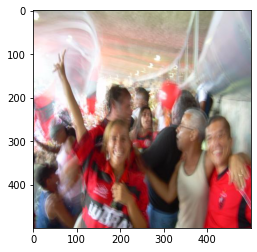

7.688118811881191


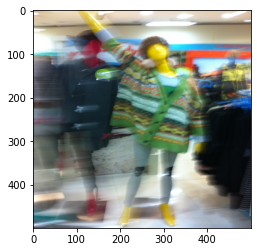

4.34391534391534


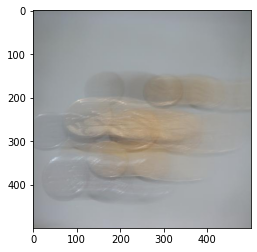

14.6382978723404


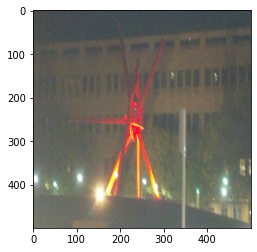

15.8952380952381


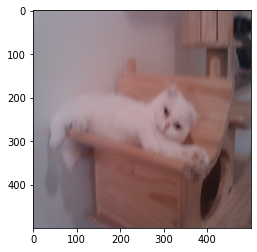

14.962365591397901


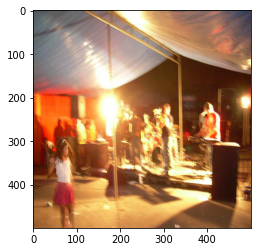

28.1758241758242


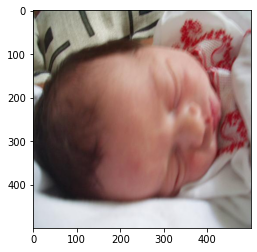

21.5740740740741


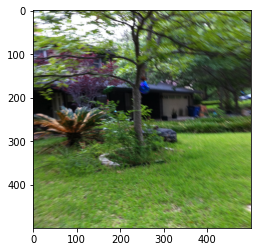

22.7076023391813


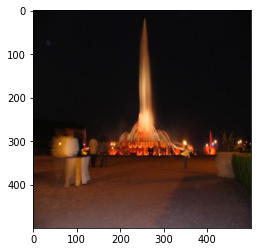

31.6408839779006


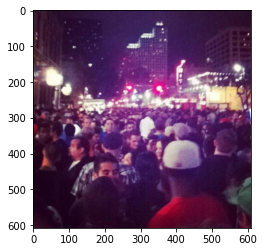

34.097701149425305


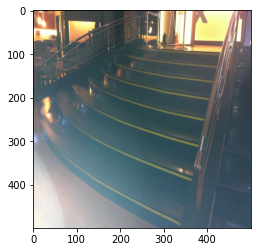

32.3220338983051


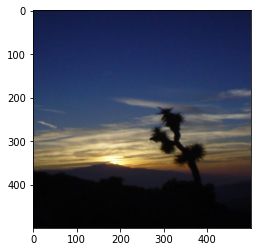

42.41212121212121


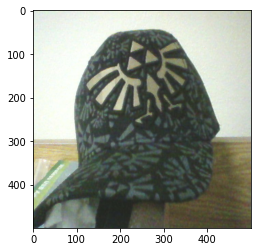

49.327485380117


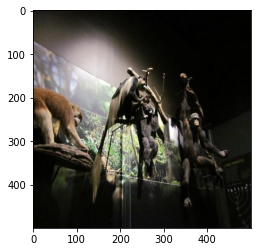

41.1


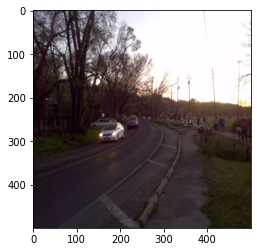

51.84153005464479


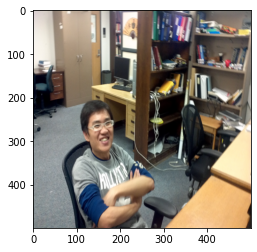

53.63742690058479


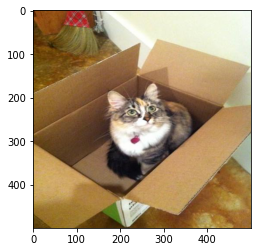

50.994413407821206


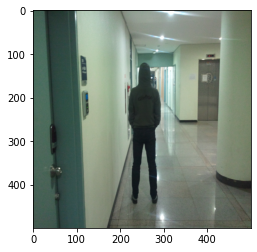

63.6407185628743


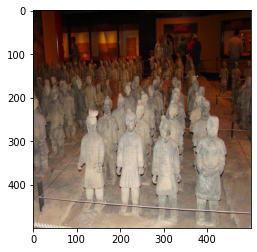

66.5780346820809


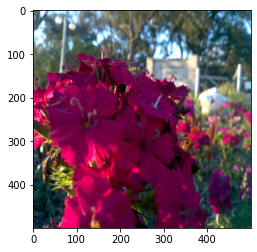

68.1485148514852


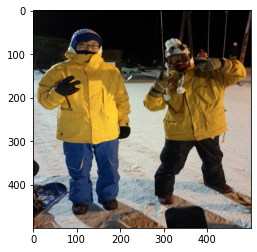

74.16564417177909


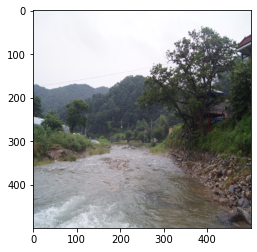

73.02590673575129


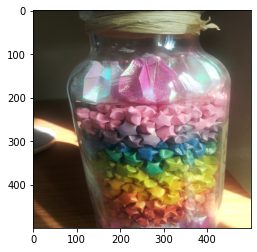

79.5029239766082


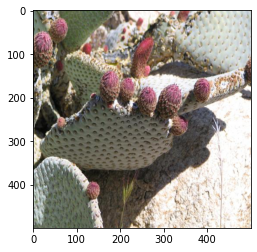

81.9050279329609


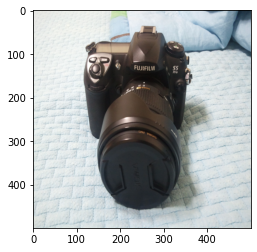

82.1111111111111


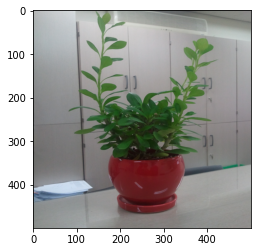

83.36309523809521


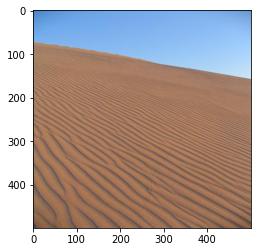

In [ ]:
for i in range(9):
    bin_df = sample_live_cl_test[sample_live_cl_test['bin'] == i].sample(n=3, random_state=1)
    for index, row in bin_df.iterrows():
        img = Image.open(row['FilePath'])
        print(row['img_score'])
        plt.imshow(img)
        plt.show()

65.1989247311828


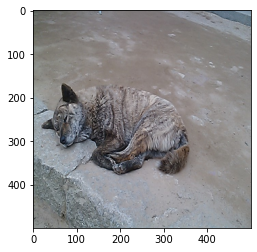

39.4134078212291


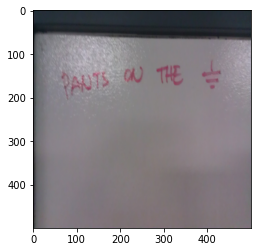

16.1345029239766


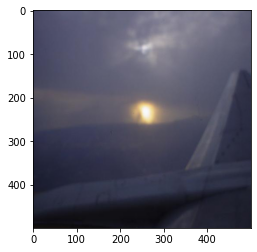

78.81935483870971


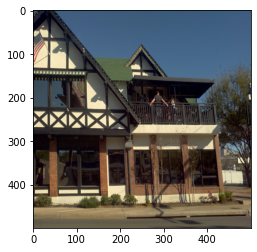

61.92682926829271


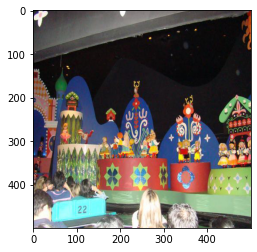

61.8837209302326


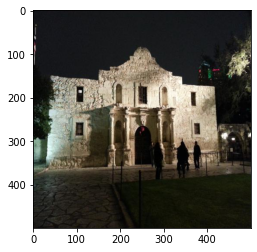

72.546511627907


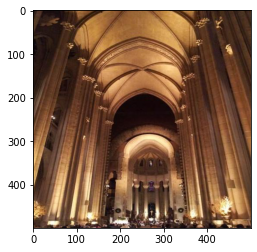

48.204545454545496


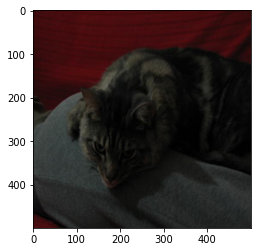

60.9472891566265


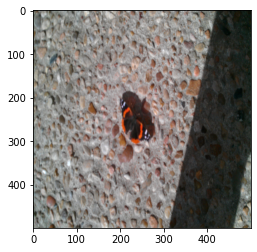

54.421875


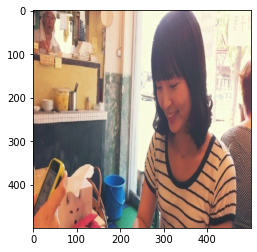

81.9050279329609


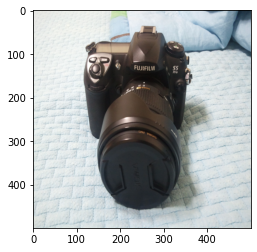

52.921686746988


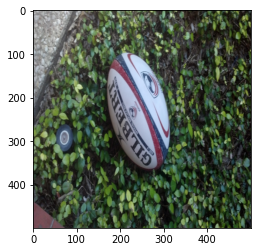

21.5740740740741


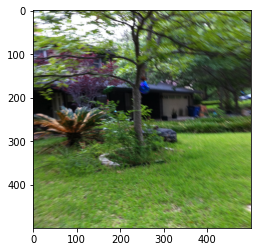

54.4047619047619


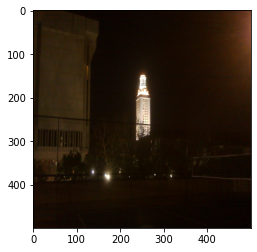

32.6277777777778


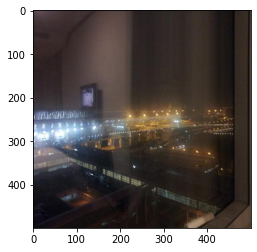

79.5029239766082


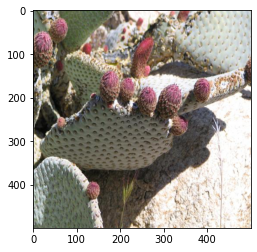

70.2670454545455


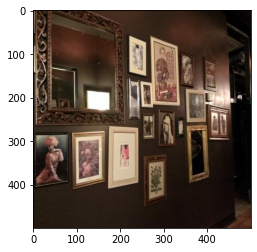

54.6184210526316


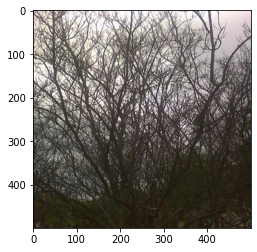

28.810650887574


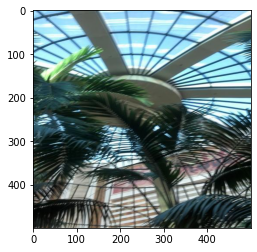

61.613095238095205


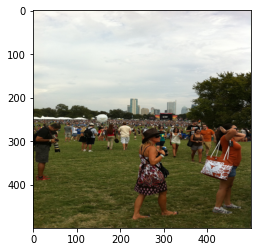

72.4574468085106


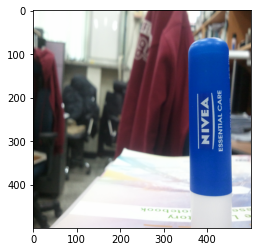

48.8034682080925


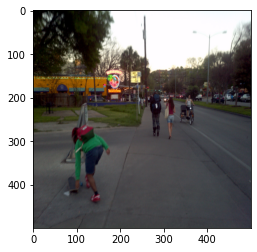

59.005747126436795


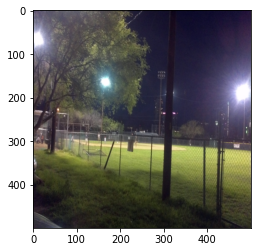

27.204678362573105


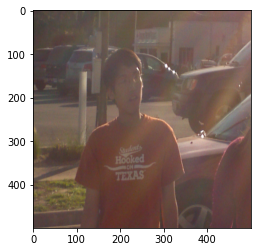

36.521472392638


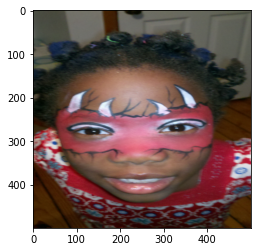

42.41212121212121


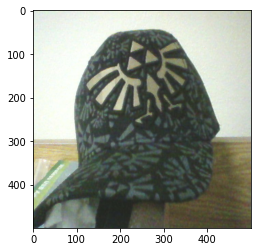

37.253968253968296


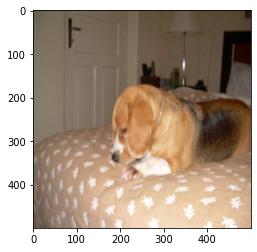

83.431693989071


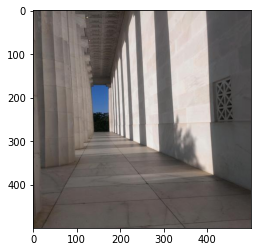

74.01840490797551


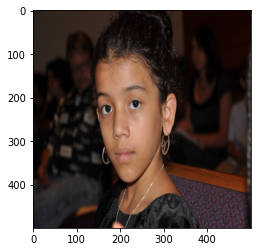

61.425


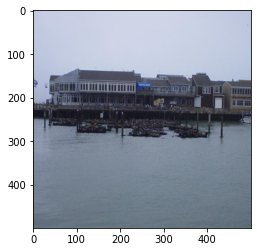

73.02590673575129


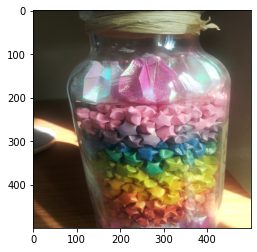

42.3352941176471


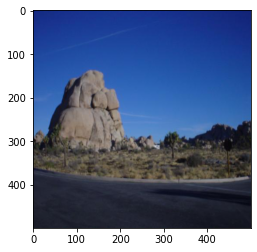

83.36309523809521


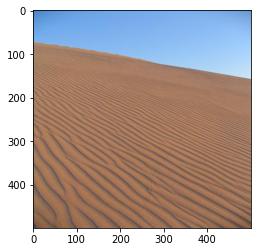

14.1781609195402


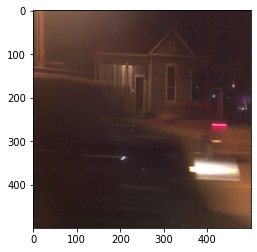

68.1485148514852


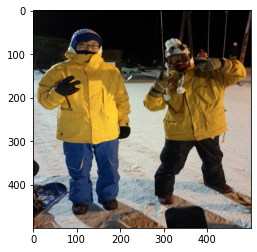

28.7756097560976


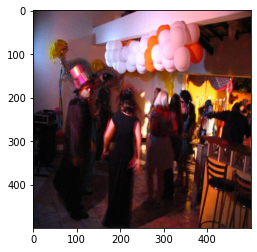

35.641975308642


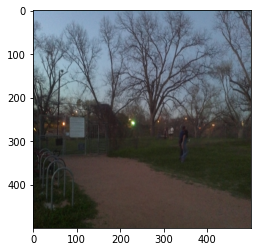

48.9152542372881


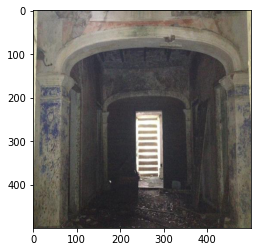

78.5301204819277


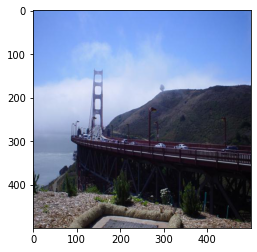

46.41340782122911


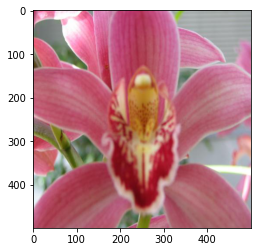

84.813829787234


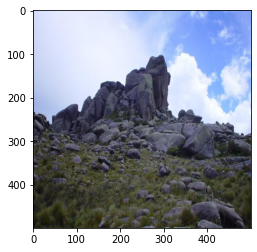

71.8823529411765


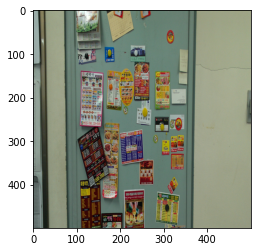

77.0714285714286


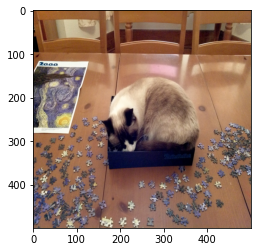

44.1428571428571


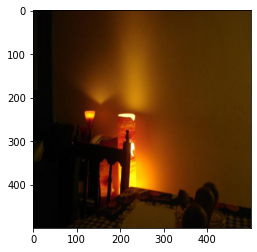

75.182320441989


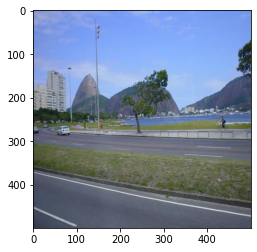

59.9883720930233


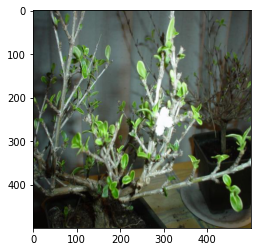

64.8203592814371


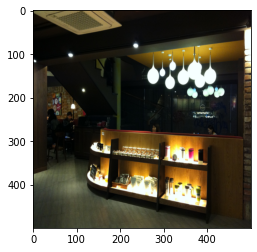

62.3502824858757


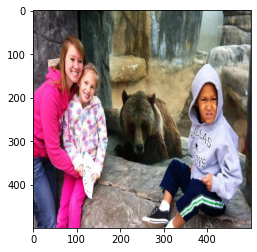

55.5923913043478


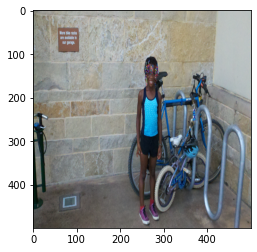

41.1


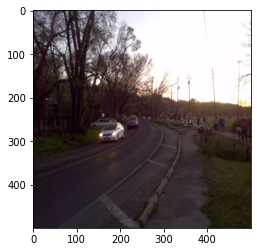

28.5128205128205


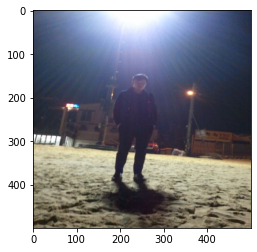

36.895705521472394


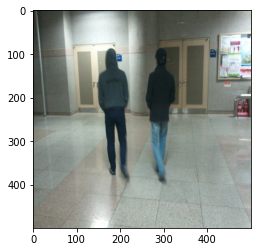

55.9939024390244


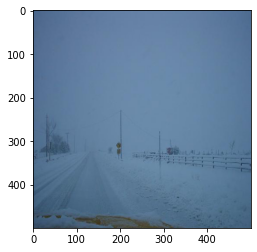

10.760736196319002


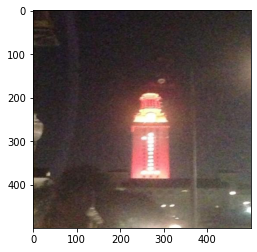

65.4180790960452


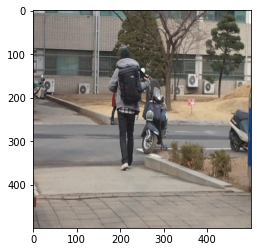

50.29411764705879


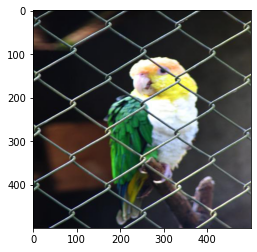

42.4397590361446


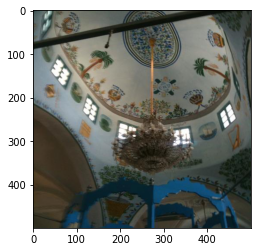

62.96174863387979


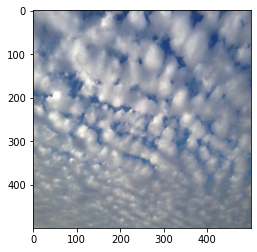

77.0171428571429


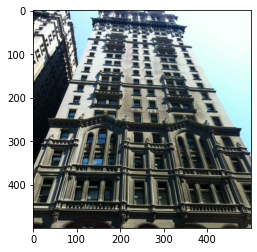

26.238888888888898


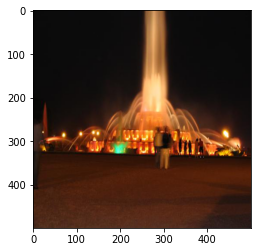

38.1234567901235


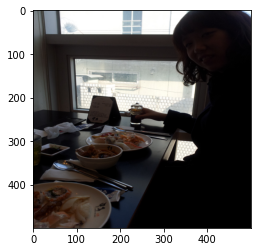

27.964102564102603


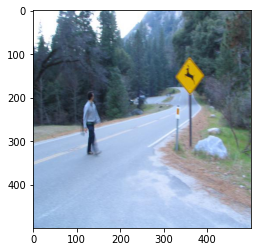

34.1234567901235


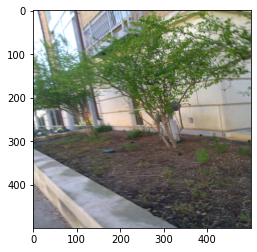

57.377245508982


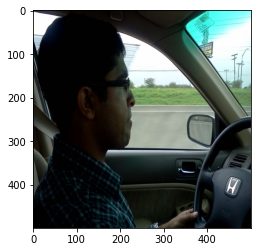

74.46236559139791


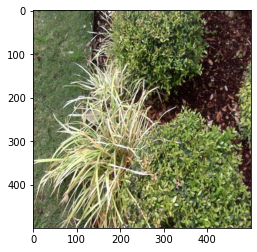

64.79041916167671


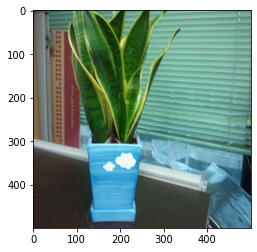

45.371069182389896


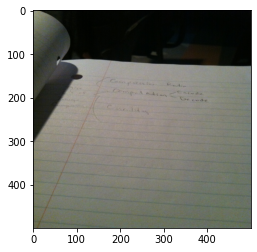

76.9239130434783


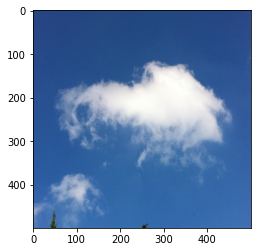

83.6213017751479


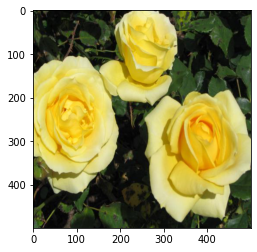

72.0602409638554


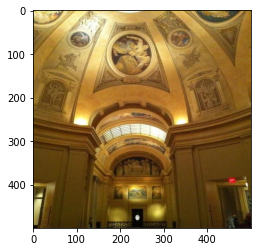

In [ ]:
 # live_cl_test_sample = live_cl_test.sample(frac=0.3, random_state=1)
for index, row in live_cl_test_sample.iterrows():
    img = Image.open(row["FilePath"])
    print(row['img_score'])
    plt.imshow(img)
    plt.show()
    # break

1 1
0
cuda
[{'val_loss': 3358.39990234375}]
model will be saved to: /content/drive/My Drive/Image_data/db_cnn_v2_challenge.pth


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


Epoch [0], srcc_train: 0.09820, plcc_train: 0.09317, srcc_val: 0.09420, plcc_val: 0.06849, loss_train: 3484.1755, loss_test: 3343.5095
Epoch [1], srcc_train: 0.32270, plcc_train: 0.32642, srcc_val: 0.19750, plcc_val: 0.18992, loss_train: 3469.0581, loss_test: 3331.3523
Epoch [2], srcc_train: 0.45670, plcc_train: 0.46931, srcc_val: 0.32512, plcc_val: 0.34509, loss_train: 3436.6880, loss_test: 3300.9668
Epoch [3], srcc_train: 0.47728, plcc_train: 0.48228, srcc_val: 0.47525, plcc_val: 0.44257, loss_train: 3375.5403, loss_test: 3244.0374
Epoch [4], srcc_train: 0.58149, plcc_train: 0.58833, srcc_val: 0.56767, plcc_val: 0.54765, loss_train: 3234.6997, loss_test: 3177.0684
Epoch [5], srcc_train: 0.73147, plcc_train: 0.75129, srcc_val: 0.66275, plcc_val: 0.68067, loss_train: 2955.9639, loss_test: 2883.8157
Epoch [6], srcc_train: 0.83399, plcc_train: 0.85459, srcc_val: 0.77961, plcc_val: 0.77858, loss_train: 2486.6406, loss_test: 1834.6975
Epoch [7], srcc_train: 0.86992, plcc_train: 0.87784, sr

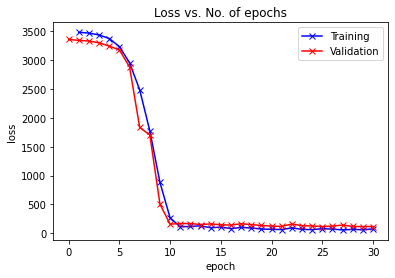

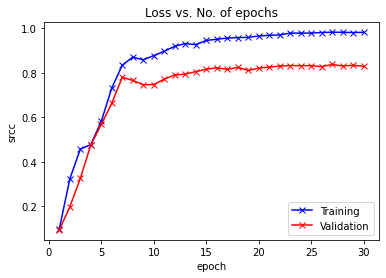

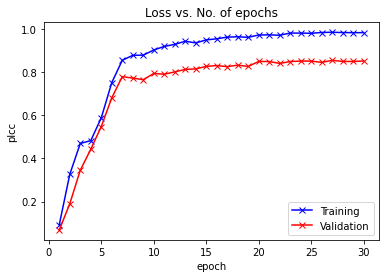

srcc: 0.8187264489247619 plcc: 0.845962721253383


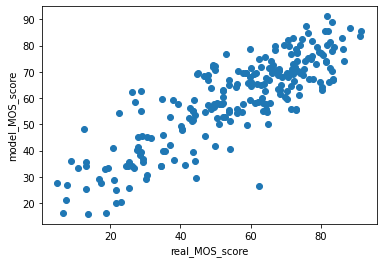

1 1
0
cuda
[{'val_loss': 3432.713623046875}]
model will be saved to: /content/drive/My Drive/Image_data/db_cnn_v2_challenge.pth
Epoch [0], srcc_train: 0.01947, plcc_train: 0.02155, srcc_val: 0.16318, plcc_val: 0.16517, loss_train: 3499.2832, loss_test: 3417.3762
Epoch [1], srcc_train: 0.26184, plcc_train: 0.27241, srcc_val: 0.26979, plcc_val: 0.23281, loss_train: 3486.2126, loss_test: 3396.6482
Epoch [2], srcc_train: 0.44822, plcc_train: 0.47214, srcc_val: 0.35220, plcc_val: 0.33176, loss_train: 3451.2930, loss_test: 3346.0466
Epoch [3], srcc_train: 0.50464, plcc_train: 0.49382, srcc_val: 0.44106, plcc_val: 0.39274, loss_train: 3385.8330, loss_test: 3260.6282
Epoch [4], srcc_train: 0.60711, plcc_train: 0.59330, srcc_val: 0.61575, plcc_val: 0.55734, loss_train: 3255.6223, loss_test: 2962.2566
Epoch [5], srcc_train: 0.77794, plcc_train: 0.79718, srcc_val: 0.75502, plcc_val: 0.75261, loss_train: 2974.6853, loss_test: 2405.8569
Epoch [6], srcc_train: 0.81122, plcc_train: 0.83667, srcc_val:

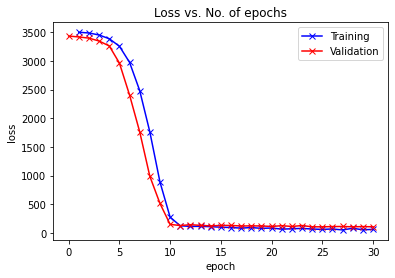

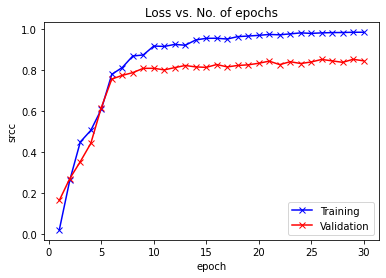

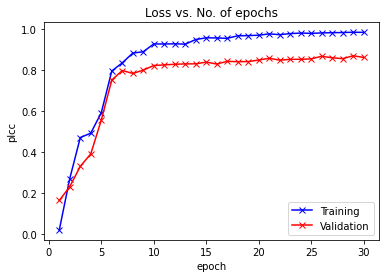

srcc: 0.8417007244149467 plcc: 0.8627903631838898


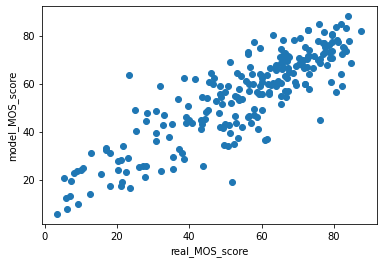

2 0
2
cuda
[{'val_loss': 3577.94140625}]
model will be saved to: /content/drive/My Drive/Image_data/db_cnn_v2_challenge.pth
Epoch [0], srcc_train: 0.12804, plcc_train: 0.13351, srcc_val: 0.10308, plcc_val: 0.11884, loss_train: 3459.0112, loss_test: 3565.5166
Epoch [1], srcc_train: 0.30471, plcc_train: 0.32378, srcc_val: 0.23412, plcc_val: 0.24089, loss_train: 3443.5498, loss_test: 3545.5200
Epoch [2], srcc_train: 0.44532, plcc_train: 0.46417, srcc_val: 0.42026, plcc_val: 0.42795, loss_train: 3423.1851, loss_test: 3511.9504
Epoch [3], srcc_train: 0.52273, plcc_train: 0.50058, srcc_val: 0.49555, plcc_val: 0.46334, loss_train: 3342.8501, loss_test: 3406.3760
Epoch [4], srcc_train: 0.65925, plcc_train: 0.67764, srcc_val: 0.64681, plcc_val: 0.65393, loss_train: 3196.6729, loss_test: 3131.4841
Epoch [5], srcc_train: 0.76788, plcc_train: 0.79974, srcc_val: 0.73305, plcc_val: 0.75455, loss_train: 2903.5493, loss_test: 2548.3691
Epoch [6], srcc_train: 0.85047, plcc_train: 0.86668, srcc_val: 0.8

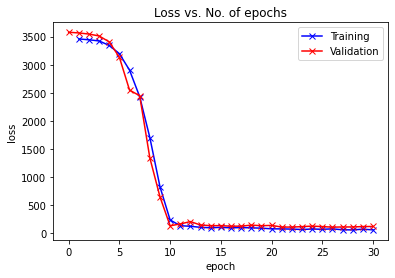

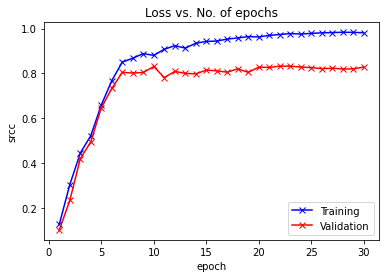

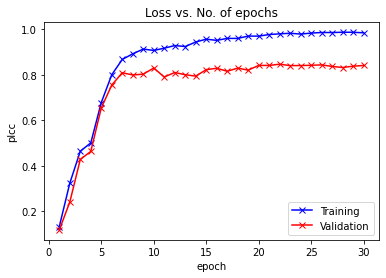

srcc: 0.8291324629196464 plcc: 0.8385385178788715


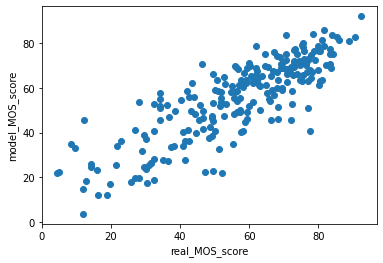

2 0
2
cuda
[{'val_loss': 3455.329833984375}]
model will be saved to: /content/drive/My Drive/Image_data/db_cnn_v2_challenge.pth
Epoch [0], srcc_train: 0.13227, plcc_train: 0.14703, srcc_val: 0.04158, plcc_val: 0.06023, loss_train: 3494.8506, loss_test: 3454.5051
Epoch [1], srcc_train: 0.32702, plcc_train: 0.32039, srcc_val: 0.16504, plcc_val: 0.18500, loss_train: 3467.9739, loss_test: 3420.1633
Epoch [2], srcc_train: 0.47661, plcc_train: 0.47229, srcc_val: 0.34689, plcc_val: 0.37907, loss_train: 3418.8826, loss_test: 3375.4053
Epoch [3], srcc_train: 0.54402, plcc_train: 0.51316, srcc_val: 0.38562, plcc_val: 0.42953, loss_train: 3373.2673, loss_test: 3322.7429
Epoch [4], srcc_train: 0.68867, plcc_train: 0.68769, srcc_val: 0.59147, plcc_val: 0.62314, loss_train: 3218.5449, loss_test: 3106.6460
Epoch [5], srcc_train: 0.79176, plcc_train: 0.80094, srcc_val: 0.68177, plcc_val: 0.71586, loss_train: 2909.2722, loss_test: 2756.8286
Epoch [6], srcc_train: 0.83835, plcc_train: 0.85875, srcc_val:

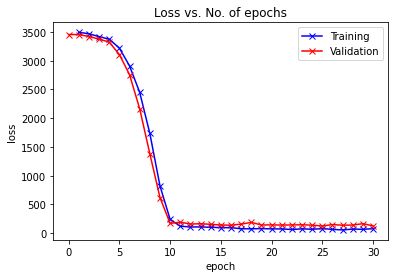

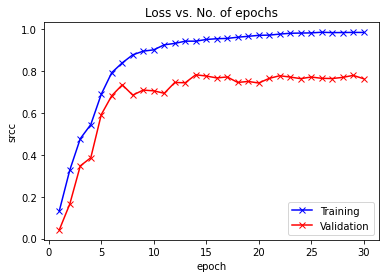

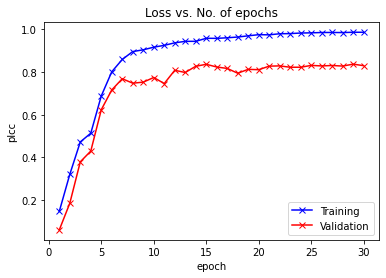

srcc: 0.7612953477046985 plcc: 0.8279873017066046


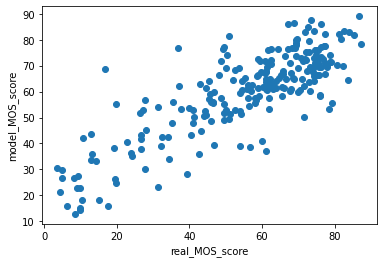

2 0
2
cuda
[{'val_loss': 3550.6669921875}]
model will be saved to: /content/drive/My Drive/Image_data/db_cnn_v2_challenge.pth
Epoch [0], srcc_train: 0.09063, plcc_train: 0.09518, srcc_val: 0.14547, plcc_val: 0.13528, loss_train: 3472.0215, loss_test: 3536.9897
Epoch [1], srcc_train: 0.31989, plcc_train: 0.33159, srcc_val: 0.24444, plcc_val: 0.24460, loss_train: 3447.7559, loss_test: 3524.1782
Epoch [2], srcc_train: 0.46062, plcc_train: 0.45401, srcc_val: 0.37841, plcc_val: 0.37125, loss_train: 3396.8879, loss_test: 3463.0164
Epoch [3], srcc_train: 0.50759, plcc_train: 0.47780, srcc_val: 0.35320, plcc_val: 0.37670, loss_train: 3338.7363, loss_test: 3348.9514
Epoch [4], srcc_train: 0.62254, plcc_train: 0.61620, srcc_val: 0.52563, plcc_val: 0.55201, loss_train: 3205.2539, loss_test: 3215.4299
Epoch [5], srcc_train: 0.80235, plcc_train: 0.79991, srcc_val: 0.71013, plcc_val: 0.74675, loss_train: 2898.6516, loss_test: 2771.5247
Epoch [6], srcc_train: 0.85475, plcc_train: 0.85300, srcc_val: 0

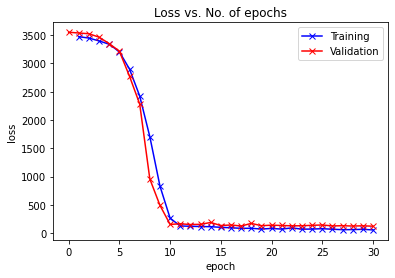

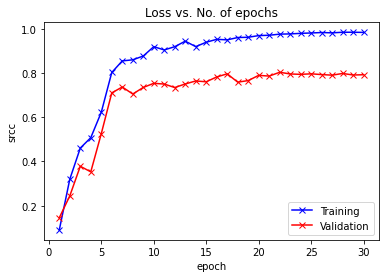

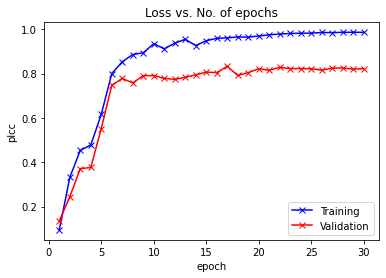

srcc: 0.8138688305922284 plcc: 0.836469558789882


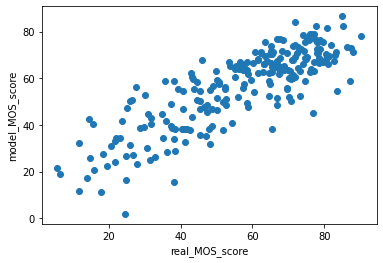

In [ ]:
srcc_list = []
plcc_list = []
kf = KFold(n_splits=5, random_state=1234, shuffle=True)
df = meta_live_challenge.drop('source', 1)
device = get_default_device()
transform_train = torchvision.transforms.Compose([
                    torchvision.transforms.RandomHorizontalFlip(),
                    torchvision.transforms.RandomCrop(size=(448, 448), pad_if_needed=True, padding_mode='reflect'),
                    torchvision.transforms.ToTensor(),
                    torchvision.transforms.Normalize(mean=(0.485, 0.456, 0.406),
                                                    std=(0.229, 0.224, 0.225))])
transform_test = torchvision.transforms.Compose([
                torchvision.transforms.ToTensor(),
                torchvision.transforms.RandomCrop(size=(448, 448), pad_if_needed=True, padding_mode='reflect'),
                torchvision.transforms.Normalize(mean=(0.485, 0.456, 0.406),
                                                  std=(0.229, 0.224, 0.225))])
# print(df)
for train_index, test_index in kf.split(df):
    # print(train_index, test_index)
    print(len(train_index)%8, len(test_index)%8)
    if len(train_index)% 8 == 1:
        train_index = train_index[:-1]
    print(len(train_index)%8)
    # if len(test_index)% 8 == 0:
    #     test_index = test_index[:-1]
    live_cl_train = df.iloc[train_index]
    live_cl_test = df.iloc[test_index]
    train_dl, test_dl = get_data_loader2(live_cl_train, live_cl_test, 1234, 8, transform_train, transform_test)
    history, model, model2 = train_process(freeze=False, epochs=30, max_lr=1e-4, grad_clip=0.1, weight_decay=5e-4, opt_func=torch.optim.Adam, train_dl=train_dl, val_dl=test_dl)
    plot_losses(history)
    plot_srcc(history)
    plot_plcc(history)
    # test_srcc, test_plcc = get_result(model, live_cl_test, transform_test)
    test_srcc, test_plcc = get_result(model2, live_cl_test, transform_test)
    srcc_list.append(test_srcc)
    plcc_list.append(plcc_list)
    # break